In [194]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [195]:
import seaborn as sns 
sns.set_style('ticks')

import matplotlib.pyplot as plt
import numpy as np
import pymc3 as pm
import scipy.stats as stats

import pickle
import re
import os
import copy

from tqdm import tqdm
from epimodel import EpidemiologicalParameters, DefaultModel, preprocess_data


from matplotlib.font_manager import FontProperties
fp2 = FontProperties(fname=r"../../fonts/Font Awesome 5 Free-Solid-900.otf")

class ResultsObject():
    pass

In [196]:
data = preprocess_data('../../merged_data/double_entry_final.csv', last_day='2020-05-30', smoothing=1)
data.mask_reopenings(print_out = False)

Dropping NPI Travel Screen/Quarantine
Dropping NPI Travel Bans
Dropping NPI Public Transport Limited
Dropping NPI Internal Movement Limited
Dropping NPI Public Information Campaigns
Dropping NPI Symptomatic Testing
Masking invalid values


In [197]:
data.CMs

['Mask Wearing',
 'Gatherings <1000',
 'Gatherings <100',
 'Gatherings <10',
 'Some Businesses Suspended',
 'Most Businesses Suspended',
 'School Closure',
 'University Closure',
 'Stay Home Order']

In [217]:
results_base_dir = "../../server_neurips2"

npi_short_names = ['Msk', '$G_{10^3}$', '$G_{100}$', '$G_{10}$', 'SoBs', 'MoBs', 'Scl', 'Uni', 'SHO']
OXCGRT_short_names = ['Tr', 'vl', 'PbTra', 'InMov', 'PbInf', 'SmTst']

def tag_fname_to_label(tag, fname):    
    if tag == "npi_leaveout":
        npi_names = data.CMs
        r = re.search(r"(\d*)", fname)[0]
        label = f"{npi_short_names[int(r[0])]}"
        for npi in r[1:]:
            label += f",\n{npi_short_names[int(npi)]}"
            
        return label
        
    if tag == "oxcgrt":
        npi_names = ['Travel Screen/Quarantine', 'Travel Bans', 'Public Transport Limited',
                          'Internal Movement Limited', 'Public Information Campaigns', 'Symptomatic Testing']
        r = re.search(r"(\d*)", fname)[0]
        label = f"{OXCGRT_short_names[int(r[0])]}"
        for npi in r[1:]:
            label += f"{OXCGRT_short_names[int(npi)]}"
        return label

    if tag == "region_holdout":
        return fname[:2]
    
    if tag == "cases_threshold":
        r = re.search(r"(cases_t)(\d*)", fname)
        return r.groups()[1]
    
    if tag == "deaths_threshold":
        r = re.search(r"(deaths_t)(\d*)", fname)
        return r.groups()[1]
            
    if tag == "npi_prior":
        if "icl" in fname:
            return "Flaxman\net. al. [8]"
        
        if "half_normal" in fname:
            return "$N^+(0.2^2)$"
        
        if "normal" in fname and "0.2" in fname and not "additive" in fname:
            return "$N(0, 0.2^2)$"
        
        if "normal" in fname and "10" in fname and not "additive" in fname:
            return "$N(0, 10^2)$"
        
        if "normal" in fname and "10" in fname and "additive" in fname:
            return "Dir(10)"
        
        if "normal" in fname and "1" in fname and "additive" in fname:
            return "Dir(1)"
        
        if "normal" in fname and "5" in fname and "additive" in fname:
            return "Dir(5)"
        
        
    if tag == "oxcgrt":
        npi_names = ['Travel Screen/Quarantine', 'Travel Bans', 'Public Transport Limited',
                          'Internal Movement Limited', 'Public Information Campaigns', 'Symptomatic Testing']
        r = re.search(r"(\d*)", fname)[0]
        label = f"{npi_names[int(r[0])]}"
        for npi in r[1:]:
            label += f",\n{npi_names[int(npi)]}"
        return label
            
    if tag == "R_prior":
        r = re.search(r"(R_prior-)(\d*.\d*)", fname)
        val = r.groups()[1]
        return val

    if tag == "region_holdout":
        return fname[:2]
    
        
    if tag == "cases_delay":
        cd = re.search(r"(cases_mean_mean-)(\d*.\d*)", fname)
        return cd.groups()[1]
    
    if tag == "deaths_delay":
        dd = re.search(r"(deaths_mean_mean-)(\d*.\d*)", fname)
        return dd.groups()[1]
    
    if tag == "generation_interval":
        gi = re.search(r"(gi_mean_mean-)(\d*.\d*)", fname)
        return gi.groups()[1]
        
    return f"{tag} - {fname}"

def load_tagged_traces(result_base_dir, model_type, tag):
    path = os.path.join(results_base_dir, model_type, tag)
    
    all_traces = []
    for filedir, _, files in os.walk(path):
        for f in files:
            if '.txt' in f and 'CasesDelay' not in f and 'DeathsDeath' not in f and '_GI_' not in f and 'divergences' not in f:
                try:
                    trace = np.loadtxt(os.path.join(filedir, f))
                    all_traces.append([trace, tag_fname_to_label(tag, f)])
                except Exception as e:
                    print(e)
                    
    return all_traces

def search_tagged_traces(result_base_dir, model_type,  tag, search_key):
    path = os.path.join(results_base_dir, model_type, tag)
    
    for filedir, _, files in os.walk(path):
        for f in files:
            if '.txt' in f and search_key in f:
                    trace = np.loadtxt(os.path.join(filedir, f))
                    label =  tag_fname_to_label(tag, f)
                    return (trace, label)
    
    print('No experiment found')
    return None

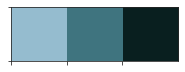

In [199]:
cols = sns.cubehelix_palette(3, start=2.4, light=0.7, dark=0.1, rot=0.1)
sns.palplot(cols)

derived_features_comb = [
 ("Mask-wearing mandatory in\n(some) public spaces", [0]),
 ("Gatherings limited to\n1000 people or less", [1]),
 ("Gatherings limited to\n100 people or less", [2, 1]),
 ("Gatherings limited to\n10 people or less", [3, 2, 1]),
 ("Some businesses\nclosed", [4]),
 ("Most nonessential\nbusinesses closed", [5, 4]),
 ("Schools and universities\nclosed", [6, 7]),
 ("Stay-at-home order\n(with exemptions)", [8]),  
 ]

derived_features_uncomb = [
 ("Mask-wearing mandatory in\n(some) public spaces", [0]),
 ("Gatherings limited to\n1000 people or less", [1]),
 ("Gatherings limited to\n100 people or less", [2]),
 ("Gatherings limited to\n10 people or less", [3]),
 ("Some businesses\nclosed", [4]),
 ("Most nonessential\nbusinesses closed", [5]),
 ("Schools and universities\nclosed", [6, 7]),
 ("Stay-at-home order\n(with exemptions)", [8]),  
 ]

fp2 = FontProperties(fname=r"../../fonts/Font Awesome 5 Free-Solid-900.otf")

cm_plot_style = [
            ("\uf963", "black"), # mask
            ("\uf0c0", cols[0]), # ppl
            ("\uf0c0", cols[1]), # ppl
            ("\uf0c0", cols[2]), # ppl
            ("\uf07a", cols[0]), # shop 1
            ("\uf07a", cols[2]), # shop2
            ("\uf549", "black"), # school
            ("\uf19d", "black"), # university
            ("\uf965", "black") # home
]

In [7]:
model_types = ['default', 'additive', 'diffeff', 'noisy_r', 'dr', 'deaths_dr', 'icl', 'default_nonoise']
model_names = ['Default', 'Additive Effects', 'Different Effects', 'Noisy-R', 'Discrete Renewal (DR)', 'Deaths-Only DR', 'Flaxman et al. [8]',  'Default\n(No Transmission Noise)']
mcols = sns.color_palette("colorblind")

In [166]:
def produce_score_sd(traces, derived_features, exclude=None, additive=False):
    median_values = np.zeros((0, len(derived_features)))
    labels_used = []
    
    for trace, label in traces:
        if exclude is not None:
            if isinstance(exclude, list):
                flags = [e in label for e in exclude]
                if any(flags):
                    continue
            else:
                if exclude in label:
                    continue
        
        if not additive:
            med = np.median(combine_trace(trace[:, :9], derived_features), axis=0)
        else:
            med = np.median(combine_trace_additive(trace[:, :9], derived_features), axis=0)
        labels_used.append(label)
        median_values = np.append(median_values, med.reshape((1, len(derived_features))), axis=0)
        
    med_stds = np.nanstd(median_values, axis=0)
    score = np.mean(med_stds)
    
    print(f'Produced stored using {[labels_used]}')
    return score

def combine_trace(trace, derived_features):
    nS, _ = trace.shape
    nCMs = len(derived_features)
    derived_samples = np.zeros((nS, nCMs))

    for f_i, (f, prodrows) in enumerate(derived_features):
        samples = np.ones(nS)
        for r in prodrows:
            samples = samples * trace[:, r] 
        derived_samples[:, f_i] = samples

    res = copy.deepcopy(derived_samples)
    res = 100*(1-res)
    
    return res


def combine_trace_additive(trace, derived_features):
    nS, _ = trace.shape
    nCMs = len(derived_features)
    derived_samples = np.zeros((nS, nCMs))
    
    
    for f_i, (f, prodrows) in enumerate(derived_features):
        samples = np.zeros(nS)
        for r in prodrows:
            samples = samples + trace[:, r] 
        derived_samples[:, f_i] = samples

    res = copy.deepcopy(derived_samples)
    res = 100*(res)
    
    return res

In [187]:
def setup_subplot(derived_features, y_ticks = True, icons = True, xlabel=True):
    nF = len(derived_features)
    ax = plt.gca()
    x_min = -25
    x_max = 100
    plt.plot([0, 0], [1, -(nF+2)], "--k", linewidth=0.5)
    
    xrange = np.array([x_min, x_max])
    for height in range(0, nF+2, 2):
        plt.fill_between(xrange, -(height-0.5), -(height+0.5), color="silver", alpha=0.5, linewidth=0)
    
    xtick_vals = [-25, 0, 25, 50, 75, 100]
    xtick_str = [f"{x:.0f}%" for x in xtick_vals] if xlabel else ['' for x in xtick_vals]
    plt.xticks(xtick_vals, xtick_str, fontsize=6)
   
    
    if y_ticks:
        plt.yticks(-np.arange(nF), [f"{f[0]}" for f in derived_features], fontsize=6, ha="left", linespacing=0.85)
        yax = ax.get_yaxis()
        yax.set_tick_params(pad=95)
        
    else:
        plt.yticks([])
    x_r = np.abs(x_min - x_max)

    plt.xlim([x_min, x_max])
    plt.ylim([-(nF - 0.25), 0.75])
    
    if icons:
        for cm in range(len(derived_features)):
            for i, val in enumerate(derived_features[cm][1]):
                plt.text(x_min - 12.5 - 16*i, -cm, cm_plot_style[val][0], horizontalalignment='center', verticalalignment='center',
                             fontproperties=fp2, fontsize=8, color=cm_plot_style[val][1], zorder=-i, alpha = 1) 
                
    if xlabel:
        plt.xlabel("Average reduction in $R_t$,\nin the context of our data", fontsize=8)
        
def add_trace_to_plot(derived_features, res, y_off, col, label, alpha, width, size=8, zeros=None):
    nS, _ = res.shape
    nF = len(derived_features)
    derived_samples = np.zeros((nS, nF))

    for f_i, (f, prodrows) in enumerate(derived_features):
        samples = np.ones(nS)
        for r in prodrows:
            samples = samples * res[:, r] 
        derived_samples[:, f_i] = samples

    res = derived_samples
    res = 100*(1-res)
    
    if zeros is not None:
        for z in zeros:
            if z < nF:
                res[:, z] = 1e5
    
    y_vals = -1 * np.arange(nF)
    plt.plot([100], [100], color=col, linewidth=1, alpha=alpha, label=label)
    mn, med, li, ui, lq, uq = produce_ranges(res)
    plt.scatter(med, y_vals+y_off, marker="|", color=col, s=size, alpha=alpha)
    for cm in range(nF):
        plt.plot([li[cm], ui[cm]], [y_vals[cm]+y_off, y_vals[cm]+y_off], color=col, alpha=alpha*0.25, linewidth=width)
        plt.plot([lq[cm], uq[cm]], [y_vals[cm]+y_off, y_vals[cm]+y_off], color=col, alpha=alpha*0.75, linewidth=width)
        
def produce_ranges(trace):
    means = np.mean(trace, axis=0)
    med = np.median(trace, axis=0)
    li = np.percentile(trace, 2.5, axis=0)
    ui = np.percentile(trace, 97.5, axis=0)
    lq = np.percentile(trace, 25, axis=0)
    uq = np.percentile(trace, 75, axis=0)
    return means, med, li, ui, lq, uq

def add_additive_trace_to_plot(derived_features, res, y_off, col, label, alpha, width, size=8, zeros=None):
    nS, _ = res.shape
    nF = len(derived_features)
    derived_samples = np.zeros((nS, nF))

    for f_i, (f, prodrows) in enumerate(derived_features):
        samples = np.zeros(nS)
        for r in prodrows:
            samples = samples + res[:, r] 
        derived_samples[:, f_i] = samples

    res = derived_samples
    res = 100*res
    
    if zeros is not None:
        for z in zeros:
            if z < nF:
                res[:, z] = 1e5
                
    print(np.median(derived_samples, axis=0))
    
    y_vals = -1 * np.arange(nF)
    plt.plot([100], [100], color=col, linewidth=1, alpha=alpha, label=label)
    mn, med, li, ui, lq, uq = produce_ranges(res)
    plt.scatter(med, y_vals+y_off, marker="|", color=col, s=size, alpha=alpha)
    for cm in range(nF):
        if cm > 7:
            plt.plot([li[cm], ui[cm]], [y_vals[cm]+y_off, y_vals[cm]+y_off], color=col, alpha=alpha*0.25*0.25, linewidth=width, linestyle="--")
            plt.plot([lq[cm], uq[cm]], [y_vals[cm]+y_off, y_vals[cm]+y_off], color=col, alpha=alpha*0.75*0.25, linewidth=width, linestyle="--")
        else:
            plt.plot([li[cm], ui[cm]], [y_vals[cm]+y_off, y_vals[cm]+y_off], color=col, alpha=alpha*0.25, linewidth=width)
            plt.plot([lq[cm], uq[cm]], [y_vals[cm]+y_off, y_vals[cm]+y_off], color=col, alpha=alpha*0.75, linewidth=width)

In [188]:
model_types = ['default', 'additive', 'diffeff', 'noisy_r', 'dr', 'deaths_dr', 'icl', 'default_nonoise']
model_names = ['Default', 'Additive Effects', 'Different Effects', 'Noisy-R', 'Discrete Renewal (DR)', 'Deaths-Only DR', 'Flaxman et al. [8]',  'Default\n(No Transmission Noise)']
mcols = sns.color_palette("colorblind")

In [218]:
def produce_model_panel_plot(mtype, mcol, results_base_dir='../../server_neurips2/', y_range=0.3):
    plt.figure(figsize=(8, 7.5), dpi=400)
    
    if mtype == 'additive':
        add_func = add_additive_trace_to_plot
    else:
        add_func = add_trace_to_plot
    
    derived_features = derived_features_comb 
    
    colors = [*sns.color_palette("colorblind"), *sns.color_palette("dark")]
    
    plt.subplot(4, 4, 1)
    plt.title('Default', fontsize=10, color=mcol)
    setup_subplot(derived_features, True, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'default')
    width = 2.5  
    add_func(derived_features, traces[0][0], 0, mcol, "", 1, width) 
    
    plt.subplot(4, 4, 2)
    plt.title('$R_0$', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'R_prior')
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
    traces.sort(key=lambda x: float(x[1]))
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    plt.subplot(4, 4, 3)
    plt.title('Generation\nInterval', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'generation_interval')
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
    traces.sort(key=lambda x: float(x[1]))
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    plt.subplot(4, 4, 4)
    plt.title('NPI Leave-Outs', fontsize=10, color=mcol)
    
    derived_features = derived_features_uncomb
    
    setup_subplot(derived_features, False, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'npi_leaveout')
        
    labels = [l for _, l in traces]
    for l_i, label in enumerate(labels):
        for cm_i, cm in enumerate(npi_short_names):
            if '<' not in cm and cm in label:
                traces[l_i][0][:, cm_i] = np.nan
            if cm == label:
                traces[l_i][0][:, cm_i] = np.nan
                
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
#     traces.sort(key=lambda x: float(x[1]))
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    derived_features = derived_features_comb
    
    plt.subplot(4, 4, 5)
    plt.title('$\{\\alpha_i\}$ Prior', fontsize=10, color=mcol)
    setup_subplot(derived_features, True, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'npi_prior')
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    plt.subplot(4, 4, 6)
    plt.title('Deaths Delay', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, False)
    traces = load_tagged_traces(results_base_dir, mtype, 'deaths_delay')
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
    traces.sort(key=lambda x: float(x[1]))
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    
    plt.subplot(4, 4, 7)
    plt.title('Cases Delay', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, False)
    traces = load_tagged_traces(results_base_dir, mtype, 'cases_delay')
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
    traces.sort(key=lambda x: float(x[1]))
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    plt.subplot(4, 4, 8)
    plt.title('OxCGRT Add-Ins', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'oxcgrt')
    
    testing_index = [n for _, n in traces].index('SmTst')
    orig = copy.deepcopy(traces[testing_index][0])
    traces[testing_index][0] = orig[:, [0, 2, 3, 4, 5, 6, 7, 8, 9]]
    
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    plt.subplot(4, 4, 9)
    plt.title('Cases Threshold', fontsize=10, color=mcol)
    setup_subplot(derived_features, True, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'cases_threshold')
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
    traces.sort(key=lambda x: float(x[1]))
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    plt.subplot(4, 4, 10)
    plt.title('Deaths Thresholds', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'deaths_threshold')
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, len(traces))
    width = 1
    
    traces.sort(key=lambda x: float(x[1]))
    
    for i, (trace, label) in enumerate(traces):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5)
    
    plt.subplot(4, 4, 11)
    plt.title('Regions 1', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, False)
    
    traces = load_tagged_traces(results_base_dir, mtype, 'region_holdout')
    score = produce_score_sd(traces, derived_features_comb)
    
    y_off = -np.linspace(-y_range, y_range, 7)
    width = 1
    
    traces.sort(key=lambda x: x[1])
    
    for i, (trace, label) in enumerate(traces[:7]):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5, loc='upper right')
    
    plt.subplot(4, 4, 12)
    plt.title('Regions 2', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, False)
    
    y_off = -np.linspace(-y_range, y_range, 7)
    width = 1
    
    for i, (trace, label) in enumerate(traces[7:14]):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5, loc='upper right')
    
    plt.subplot(4, 4, 13)
    plt.title('Regions 3', fontsize=10, color=mcol)
    setup_subplot(derived_features, True, True, True)
    
    y_off = -np.linspace(-y_range, y_range, 7)
    width = 1

    for i, (trace, label) in enumerate(traces[14:21]):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5, loc='upper right')
    
    plt.subplot(4, 4, 14)
    plt.title('Regions 4', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, True)
    y_off = -np.linspace(-y_range, y_range, 7)
    width = 1

    for i, (trace, label) in enumerate(traces[21:28]):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5, loc='upper right')
    
    plt.subplot(4, 4, 15)
    plt.title('Regions 5', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, True)
    y_off = -np.linspace(-y_range, y_range, 7)
    width = 1

    for i, (trace, label) in enumerate(traces[28:35]):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5, loc='upper right')
    
    plt.subplot(4, 4, 16)
    plt.title('Regions 6', fontsize=10, color=mcol)
    setup_subplot(derived_features, False, True, True)
    y_off = -np.linspace(-y_range, y_range, 7)
    width = 1
    
    for i, (trace, label) in enumerate(traces[35:]):
        add_func(derived_features, trace, y_off[i], colors[i], label, 1, width) 
    plt.legend(fontsize=5, loc='upper right')

    
    plt.tight_layout(w_pad=-0.75)
    plt.savefig(f'{mtype}.pdf', bbox_inches='tight')

Produced stored using [['2.78', '4.28', '3.78', '2.38', '3.28']]
Produced stored using [['6.06', '5.06', '7.06', '4.06', '3.06']]
Produced stored using [['SoBs', 'MoBs', 'Uni', 'Scl', '$G_{10}$', '$G_{100}$', 'Msk', 'SHO', '$G_{10^3}$']]
Produced stored using [['$N^+(0.2^2)$', 'Flaxman\net. al. [8]', '$N(0, 10^2)$', '$N(0, 0.2^2)$']]
Produced stored using [['17.82', '21.82', '25.82', '23.82', '19.82']]
Produced stored using [['7.92', '10.92', '12.42', '9.42', '13.92']]
Produced stored using [['PbInf', 'SmTst', 'InMov', 'PbTra', 'Trvl']]
Produced stored using [['30', '10', '50', '300', '200']]
Produced stored using [['30', '1', '50']]
Produced stored using [['RS', 'PL', 'GE', 'GR', 'DK', 'IL', 'GB', 'SG', 'FR', 'SE', 'LV', 'AD', 'LT', 'CZ', 'MT', 'NO', 'CH', 'MA', 'NZ', 'NL', 'AT', 'BA', 'MY', 'MX', 'AL', 'BE', 'BG', 'ZA', 'FI', 'EE', 'HU', 'SI', 'ES', 'IE', 'SK', 'RO', 'IS', 'PT', 'HR', 'IT', 'DE']]


'Font Awesome 5 Free-Solid-900.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


[0.03659178 0.13483125 0.24540415 0.31281268 0.10109388 0.16444654
 0.23645864 0.04726338]
Produced stored using [['2.78', '4.28', '2.38', '3.28']]
[0.04321314 0.09467891 0.19660625 0.27494737 0.09921977 0.1745673
 0.20437592 0.06055899]
[0.04003494 0.10983217 0.21764078 0.29243561 0.10149767 0.17114613
 0.21835891 0.0532435 ]
[0.03668697 0.13345781 0.24481269 0.31226801 0.10084861 0.16422634
 0.23720614 0.04711948]
[0.03318999 0.17093731 0.2809817  0.33702982 0.09837999 0.15747505
 0.25483167 0.04332039]
Produced stored using [['6.06', '5.06', '7.06', '4.06', '3.06']]
[0.04161716 0.11706405 0.19680289 0.24211486 0.07146339 0.12666423
 0.20008531 0.04909055]
[0.03693136 0.1515318  0.24911319 0.30249875 0.08635124 0.14297419
 0.22991183 0.04559979]
[0.03672628 0.13463074 0.24517556 0.31210142 0.1013314  0.16519151
 0.23668064 0.04723619]
[0.03761826 0.11755858 0.23489149 0.31497019 0.11158895 0.18439474
 0.23377954 0.05197107]
[0.03760408 0.10867268 0.22997698 0.3212479  0.11764271 0.19

'Font Awesome 5 Free-Solid-900.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


Produced stored using [['2.78', '4.28', '2.38', '3.28']]
Produced stored using [['6.06', '5.06', '7.06', '4.06', '3.06']]
Produced stored using [['SoBs', 'MoBs', 'Uni', 'Scl', '$G_{10}$', '$G_{100}$', 'Msk', 'SHO', '$G_{10^3}$']]
Produced stored using [['$N^+(0.2^2)$', 'Flaxman\net. al. [8]', '$N(0, 10^2)$']]
Produced stored using [['17.82', '21.82', '25.82', '23.82', '19.82']]
Produced stored using [['7.92', '10.92', '12.42', '9.42', '13.92']]
Produced stored using [['SmTst', 'InMov', 'PbTra', 'Trvl']]
Produced stored using [['30', '10', '50', '300', '200']]
Produced stored using [['5', '30', '1', '50']]
Produced stored using [['RS', 'PL', 'GE', 'GR', 'DK', 'IL', 'GB', 'SG', 'FR', 'SE', 'LV', 'AD', 'LT', 'CZ', 'MT', 'NO', 'CH', 'MA', 'NZ', 'NL', 'AT', 'BA', 'MY', 'MX', 'AL', 'BE', 'BG', 'ZA', 'FI', 'EE', 'HU', 'SI', 'ES', 'IE', 'SK', 'RO', 'IS', 'PT', 'HR', 'IT', 'DE']]


'Font Awesome 5 Free-Solid-900.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


Produced stored using [['2.78', '4.28', '3.78', '2.38', '3.28']]
Produced stored using [['6.06', '5.06', '7.06', '4.06', '3.06']]
Produced stored using [['SoBs', 'MoBs', 'Uni', 'Scl', '$G_{10}$', '$G_{100}$', 'Msk', 'SHO', '$G_{10^3}$']]
Produced stored using [['$N^+(0.2^2)$', 'Flaxman\net. al. [8]', '$N(0, 10^2)$', '$N(0, 0.2^2)$']]
Produced stored using [['17.82', '21.82', '25.82', '23.82', '19.82']]
Produced stored using [['7.92', '10.92', '12.42', '9.42', '13.92']]
Produced stored using [['PbInf', 'SmTst', 'InMov', 'PbTra', 'Trvl']]
Produced stored using [['30', '10', '50', '300', '200']]
Produced stored using [['5', '30', '1', '50']]
Produced stored using [['RS', 'PL', 'GE', 'GR', 'DK', 'IL', 'GB', 'SG', 'FR', 'SE', 'LV', 'AD', 'LT', 'CZ', 'MT', 'NO', 'CH', 'MA', 'NZ', 'NL', 'AT', 'BA', 'MY', 'MX', 'AL', 'BE', 'BG', 'ZA', 'FI', 'EE', 'HU', 'SI', 'ES', 'IE', 'SK', 'RO', 'IS', 'PT', 'HR', 'IT', 'DE']]


'Font Awesome 5 Free-Solid-900.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


Produced stored using [['2.78', '4.28', '3.78', '2.38', '3.28']]
Produced stored using [['6.06', '5.06', '7.06', '4.06', '3.06']]
Produced stored using [['SoBs', 'MoBs', 'Uni', 'Scl', '$G_{10}$', '$G_{100}$', 'Msk', 'SHO', '$G_{10^3}$']]
Produced stored using [['$N^+(0.2^2)$', '$N(0, 10^2)$', '$N(0, 0.2^2)$']]
Produced stored using [['17.82', '21.82', '25.82', '23.82', '19.82']]
Produced stored using [['7.92', '10.92', '12.42', '9.42', '13.92']]
Produced stored using [['PbInf', 'SmTst', 'InMov', 'PbTra', 'Trvl']]
Produced stored using [['30', '10', '50', '300', '200']]
Produced stored using [['5', '30', '1', '50']]
Produced stored using [['RS', 'PL', 'GE', 'GR', 'DK', 'IL', 'GB', 'SG', 'FR', 'SE', 'LV', 'AD', 'LT', 'CZ', 'MT', 'NO', 'CH', 'MA', 'NZ', 'NL', 'AT', 'BA', 'MY', 'MX', 'AL', 'BE', 'BG', 'ZA', 'FI', 'EE', 'HU', 'SI', 'ES', 'IE', 'SK', 'RO', 'IS', 'PT', 'HR', 'IT', 'DE']]


'Font Awesome 5 Free-Solid-900.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


Produced stored using [['2.78', '4.28', '3.78', '2.38', '3.28']]
Produced stored using [['6.06', '5.06', '7.06', '4.06', '3.06']]
Produced stored using [['SoBs', 'MoBs', 'Uni', 'Scl', '$G_{10}$', '$G_{100}$', 'Msk', 'SHO', '$G_{10^3}$']]
Produced stored using [['$N^+(0.2^2)$', 'Flaxman\net. al. [8]', '$N(0, 10^2)$', '$N(0, 0.2^2)$']]
Produced stored using [['17.82', '21.82', '25.82', '23.82', '19.82']]
Produced stored using [['7.92', '10.92', '12.42', '9.42', '13.92']]
Produced stored using [['PbInf', 'SmTst', 'InMov', 'PbTra', 'Trvl']]
Produced stored using [['30', '10', '50', '300', '200']]
Produced stored using [['5', '30', '1', '50']]
Produced stored using [['RS', 'PL', 'GE', 'GR', 'DK', 'IL', 'GB', 'SG', 'FR', 'SE', 'LV', 'AD', 'LT', 'CZ', 'NO', 'CH', 'MA', 'NZ', 'NL', 'AT', 'BA', 'MY', 'MX', 'AL', 'BE', 'BG', 'ZA', 'FI', 'EE', 'HU', 'SI', 'ES', 'IE', 'SK', 'RO', 'IS', 'PT', 'HR', 'IT', 'DE']]


'Font Awesome 5 Free-Solid-900.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


Produced stored using [['4.28', '3.78', '2.38', '3.28']]
Produced stored using [['6.06', '5.06', '7.06', '4.06', '3.06']]
Produced stored using [['SoBs', 'MoBs', 'Uni', 'Scl', '$G_{10}$', '$G_{100}$', 'Msk', 'SHO', '$G_{10^3}$']]
Produced stored using [['$N^+(0.2^2)$', 'Flaxman\net. al. [8]', '$N(0, 10^2)$', '$N(0, 0.2^2)$']]
Produced stored using [['17.82', '21.82', '25.82', '23.82', '19.82']]
Produced stored using [['7.92', '10.92', '12.42', '9.42', '13.92']]
Produced stored using [['PbInf', 'SmTst', 'InMov', 'PbTra', 'Trvl']]
Produced stored using [['30', '10', '50', '300', '200']]
Produced stored using [['5', '30', '1', '50']]
Produced stored using [['RS', 'PL', 'GE', 'GR', 'DK', 'IL', 'GB', 'SG', 'FR', 'SE', 'LV', 'AD', 'LT', 'CZ', 'NO', 'CH', 'MA', 'NZ', 'NL', 'AT', 'BA', 'MY', 'MX', 'AL', 'BE', 'BG', 'ZA', 'FI', 'EE', 'HU', 'SI', 'ES', 'IE', 'SK', 'RO', 'IS', 'PT', 'HR', 'IT', 'DE']]


'Font Awesome 5 Free-Solid-900.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


Produced stored using [['2.78', '4.28', '2.38', '3.28']]
Produced stored using [['6.06', '5.06', '7.06', '4.06', '3.06']]
Produced stored using [['SoBs', 'MoBs', 'Uni', 'Scl', '$G_{10}$', '$G_{100}$', 'Msk', 'SHO', '$G_{10^3}$']]
Produced stored using [['$N^+(0.2^2)$', 'Flaxman\net. al. [8]', '$N(0, 10^2)$', '$N(0, 0.2^2)$']]
Produced stored using [['17.82', '21.82', '25.82', '23.82', '19.82']]
Produced stored using [['7.92', '10.92', '12.42', '9.42', '13.92']]
Produced stored using [['PbInf', 'SmTst', 'InMov', 'PbTra', 'Trvl']]
Produced stored using [['30', '10', '50', '300', '200']]
Produced stored using [['5', '30', '1', '50']]
Produced stored using [['RS', 'PL', 'GE', 'GR', 'DK', 'IL', 'GB', 'SG', 'FR', 'SE', 'LV', 'AD', 'CZ', 'MT', 'NO', 'CH', 'MA', 'NZ', 'NL', 'AT', 'BA', 'MY', 'MX', 'AL', 'BE', 'BG', 'ZA', 'FI', 'EE', 'HU', 'SI', 'ES', 'IE', 'SK', 'RO', 'IS', 'PT', 'HR', 'IT', 'DE']]


'Font Awesome 5 Free-Solid-900.otf' can not be subsetted into a Type 3 font. The entire font will be embedded in the output.


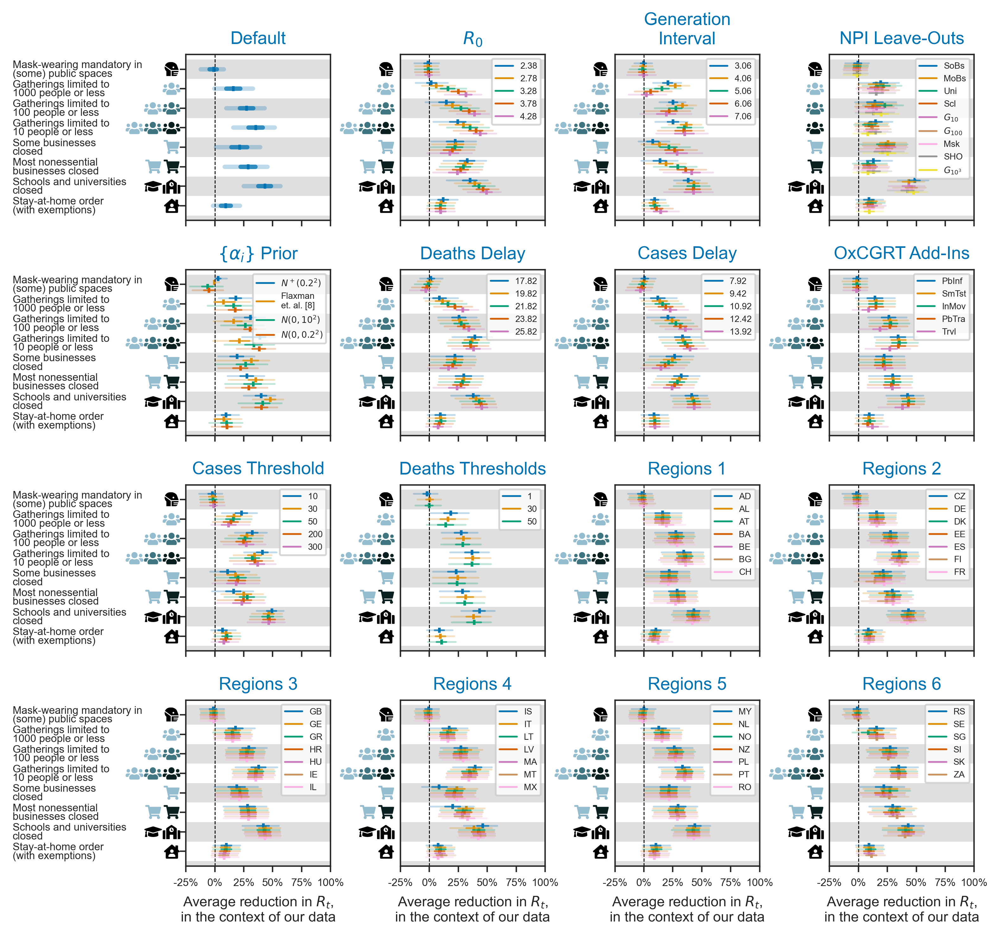

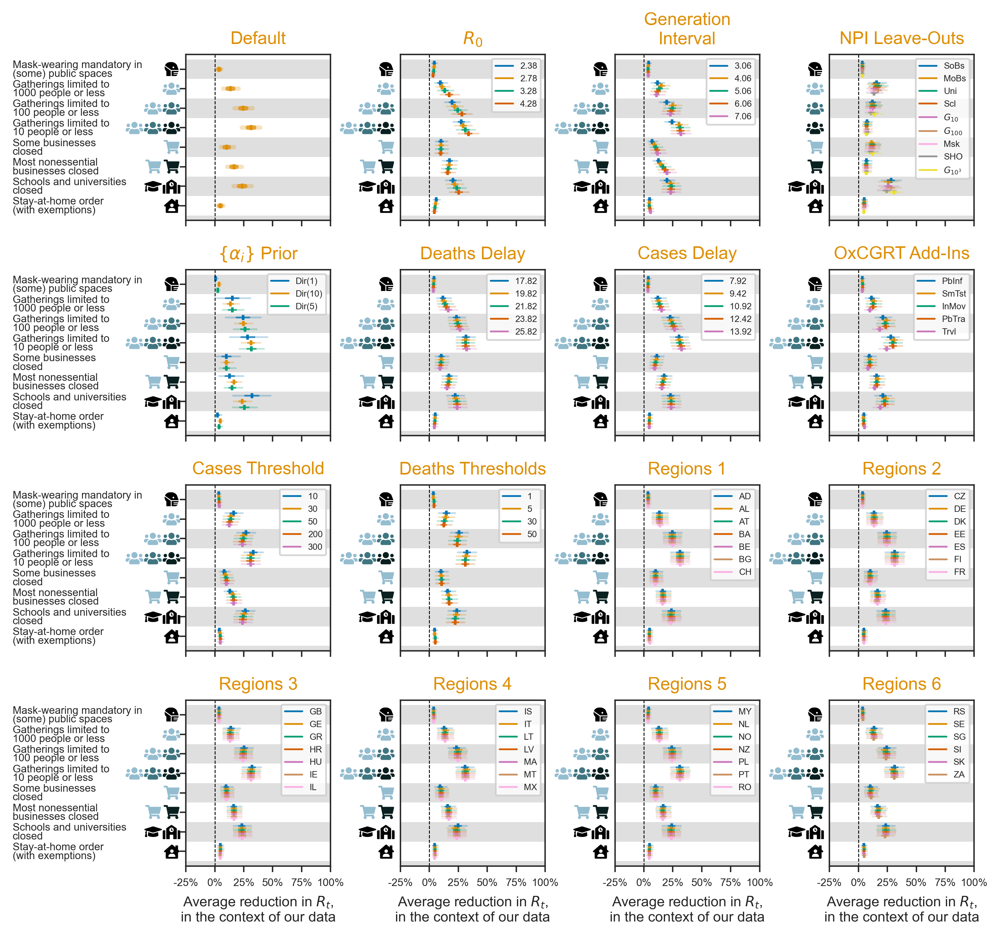

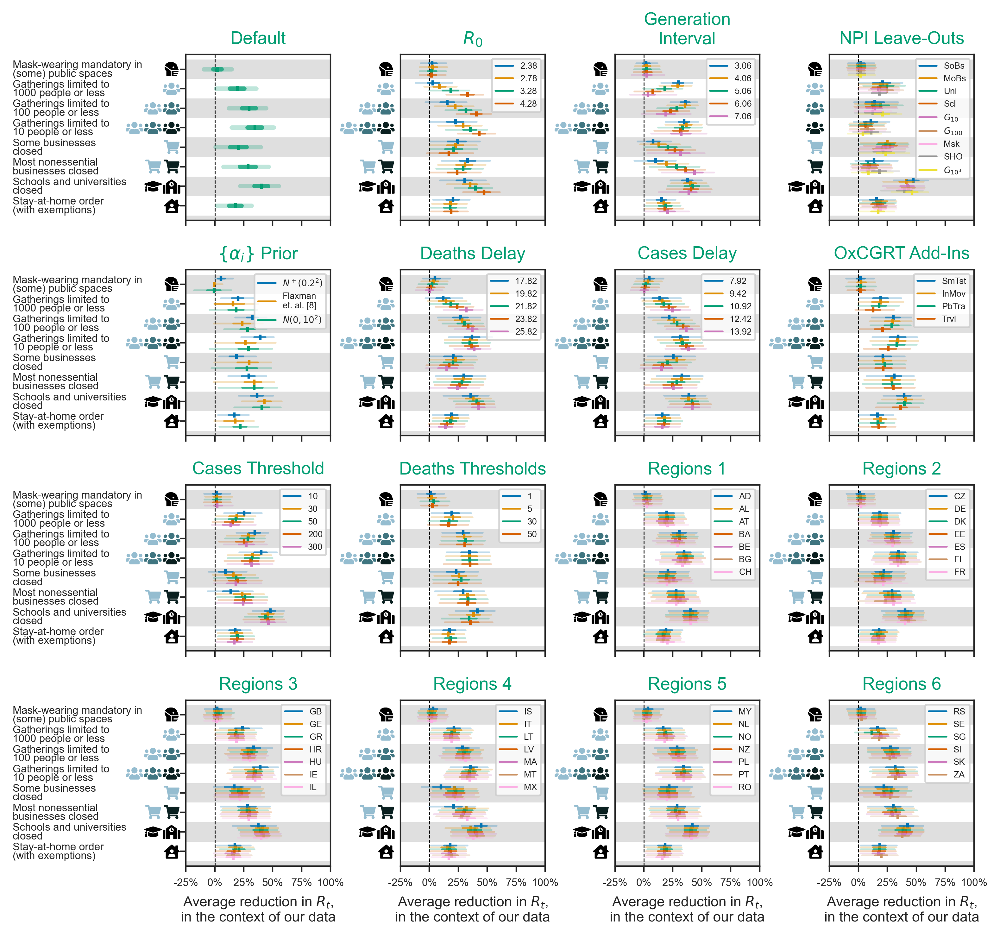

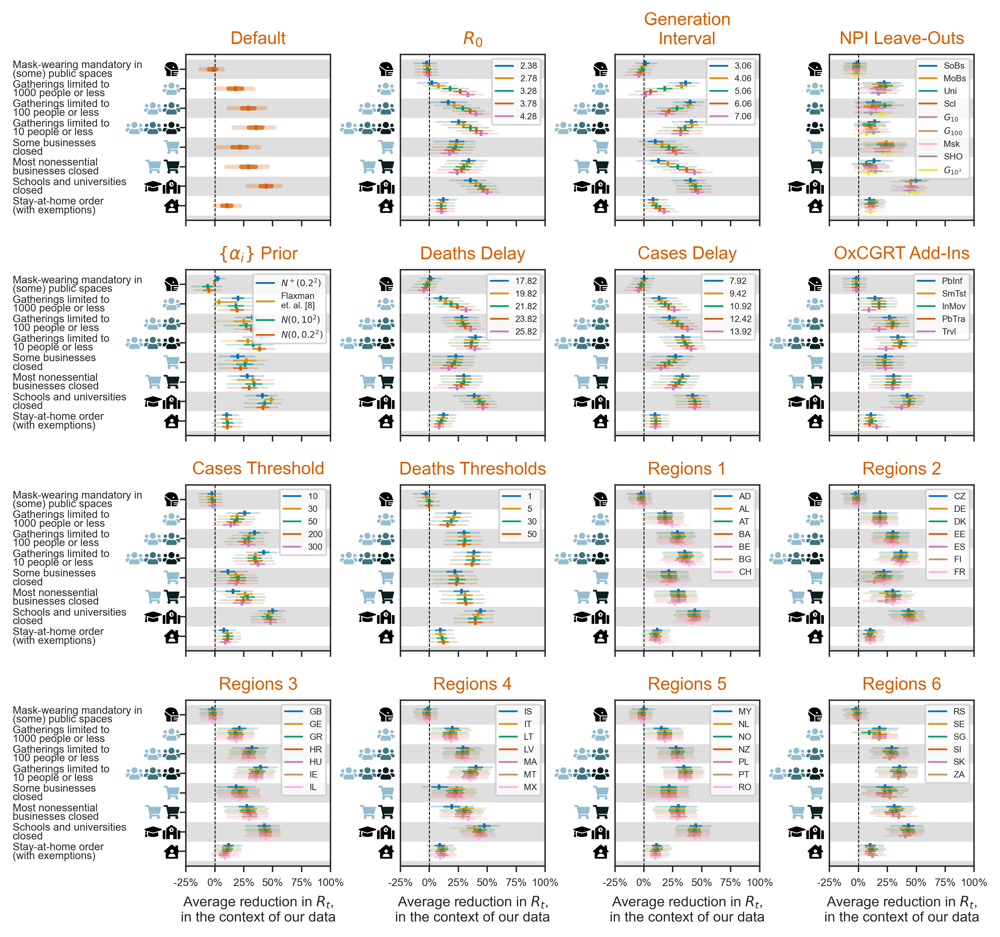

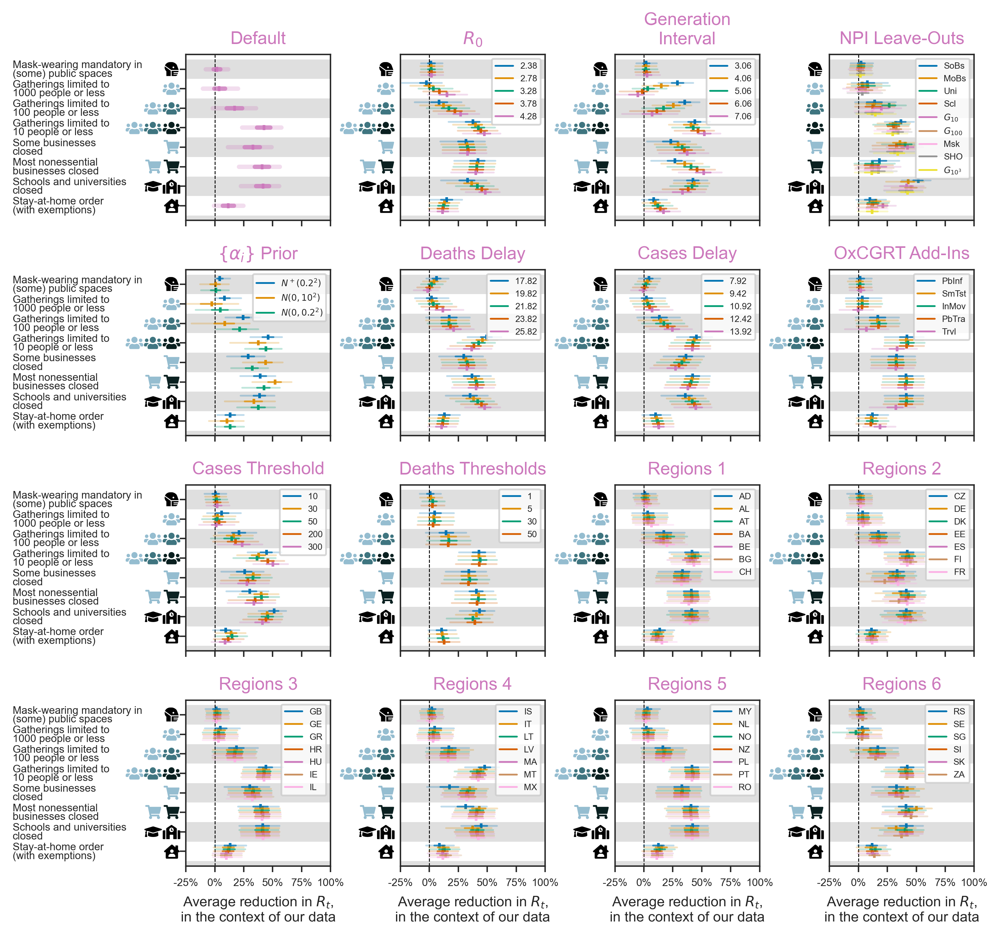

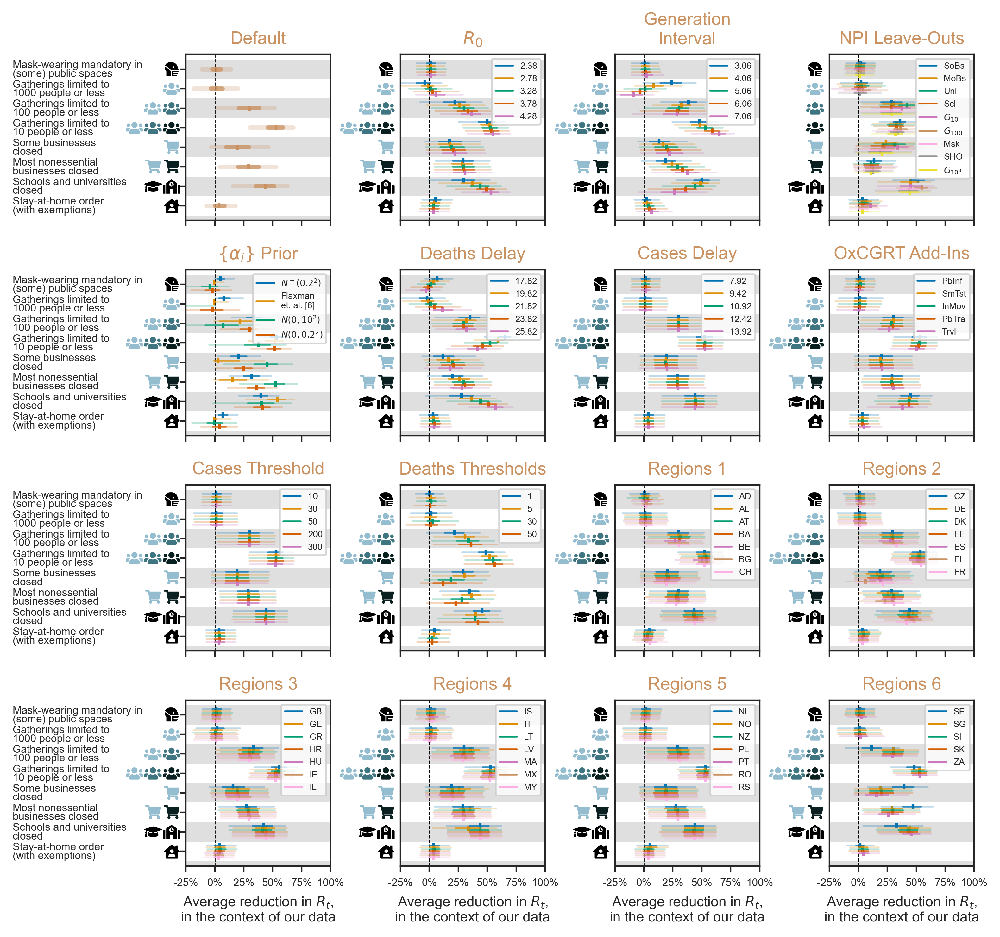

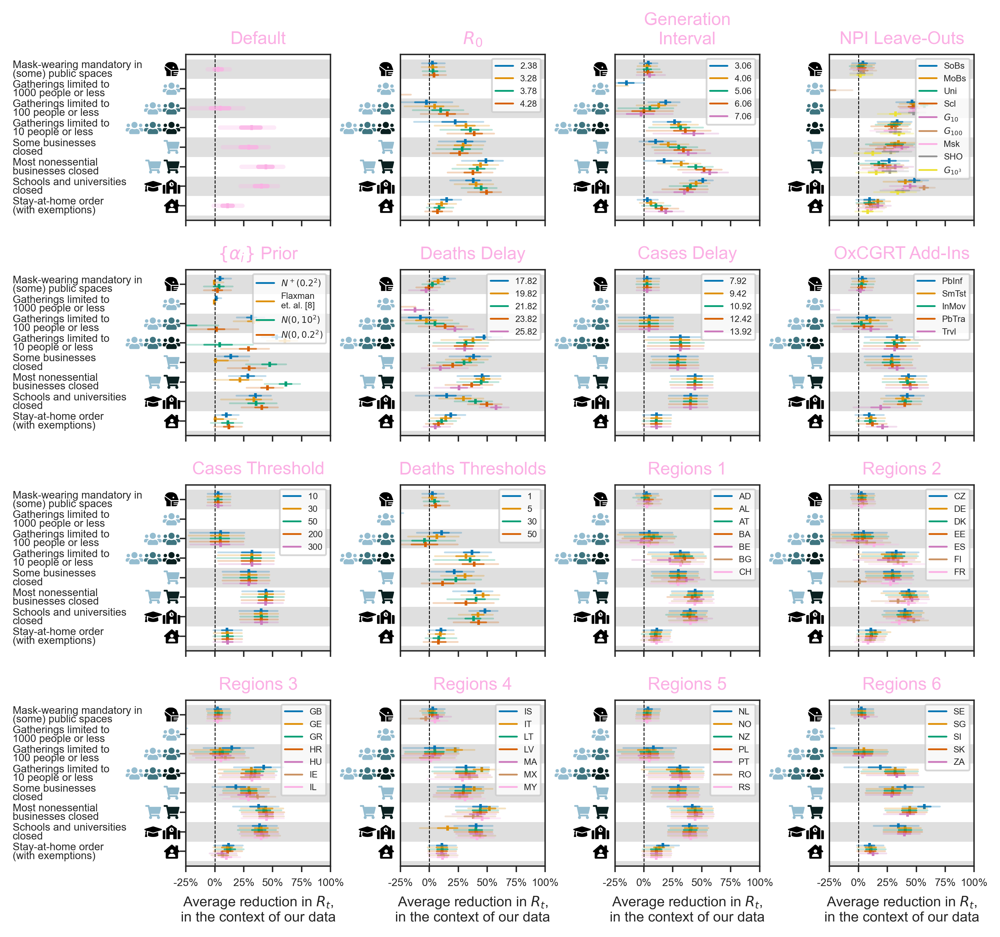

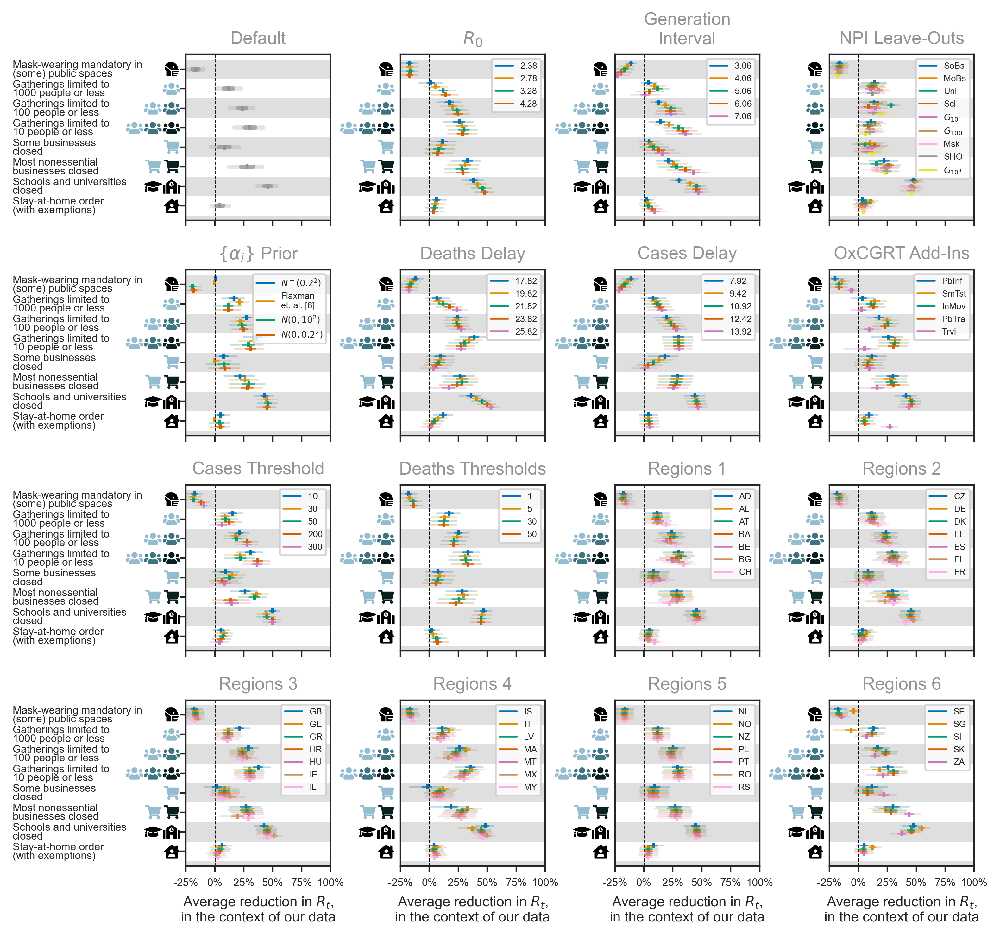

In [219]:
for m_t, m_c in zip(model_types, mcols):
    produce_model_panel_plot(m_t, m_c)